# IPBME6UE: Problem Set 2 - Medical Image Processing

## Spring 2024

## Group Members

**Person 1:**

David Bobek

### Welcome to Problem Set 2!

In this problem set, we will be exploring some fundamental concepts in digital image processing. We will be also be doing some math! Luckily, iPython notebooks have the additional ability of interpreting LaTeX ($\LaTeX$) for typesetting mathematical expressions. For example:

$$ f(t)*g(t) = \int_{-\infty}^{\infty} f(\tau)g(t-\tau)d\tau $$

This says that a convolution is defined as the integral of the product of the two functions after one is reversed and shifted. Note the word reversed, as in the kernel is mirrored along both axes. Here's another example:

$$y(x) = \frac{\sum_{i=2}^{i=3} x^i}{M}$$

This says nothing meaningful. ¯\\_(ツ)_/¯

If you are not familiar with $\LaTeX$, don't worry! You can learn it very quickly just by doing this assignment. If you are looking for more practice, try some of [these](http://www.personal.ceu.hu/tex/cookbook.html) examples out.

## Setup

We start by importing the packages we will be working with.


In [35]:
import numpy as np
import nibabel as nib

from pathlib import Path
from matplotlib import pyplot as plt

plt.rcParams['figure.figsize'] = (20, 10)

Got an error during the import?

Try installing the missing packages - you can do it even from within the notebook by typing in a cell the command with a preceding `!`

* [PIL](https://pillow.readthedocs.io/en/stable/installation.html) -  `!pip install Pillow`
* [skimage](https://scikit-image.org/docs/stable/install.html) - `!pip install scikit-image`
* [nibabel](https://nipy.org/nibabel/installation.html) - `!pip install nibabel`

Please ensure that you have the data folder from the zipped file.
If needed, set the path properly here:

In [36]:
##### IMPORTANT!!! ####
# Change this to be your unzipped data folder:
data_folder = Path('data')

assert data_folder.exists()

## Problem 1: Linear (& Non-Linear) Filtering (25 points) 

**a.** Image matrix $A$ consists of a small diamond surrounded by a layer of zeros. Compute the 2D convolution between image matrix $A$ and filter kernel $K$. The output image will be the same shape as the input image, so you can assume a single zero padding layer on each side of the image.

We have given you the image matrix $A$ and the filter kernel $K$ in the cell below. 

First, do this 2D convolution by hand (to get a better understanding of what is happening there). Then, check your answer in the cell below that. 

*Hint: you may find a particular function in the `scipy.signal` package helpful for this task.*

In [37]:
matA = np.array([[0., 0., 0., 0., 0.],
                 [0., 0., 1., 0., 0.],
                 [0., 1., 0., 1., 0.],
                 [0., 0., 1., 0., 0.],
                 [0., 0., 0., 0., 0.]])

kerK = np.array([
                 [1., 1., 1.],
                 [1., 1., 1.],
                 [1., 1., 1.],
                ])


In [38]:
####### WRITE YOUR CODE TO APPLY MATRIX A WITH THE FILTER KERNEL K IN HERE. ##########################
####### You can have up to 2 cells for this question, but only one is required #######################

def apply_kernel(matA:np.array, kerK:np.array):
    m, n = matA.shape
    k, l = kerK.shape

    # Initialize an empty result matrix
    result = np.zeros((m, n))

    # Perform manual convolution
    for i in range(m):
        for j in range(n):
            for x in range(k):
                for y in range(l):
                    if i+x-1 >= 0 and i+x-1 < m and j+y-1 >= 0 and j+y-1 < n:
                        result[i, j] += matA[i+x-1, j+y-1] * kerK[x, y]
    return result

result = apply_kernel(matA, kerK)



######################################################################################################

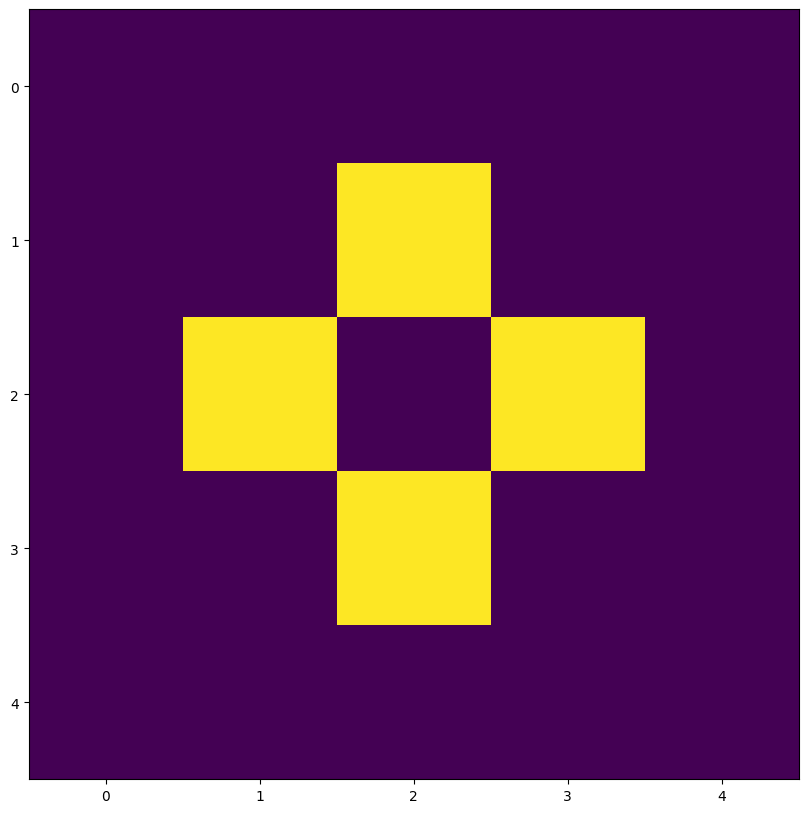

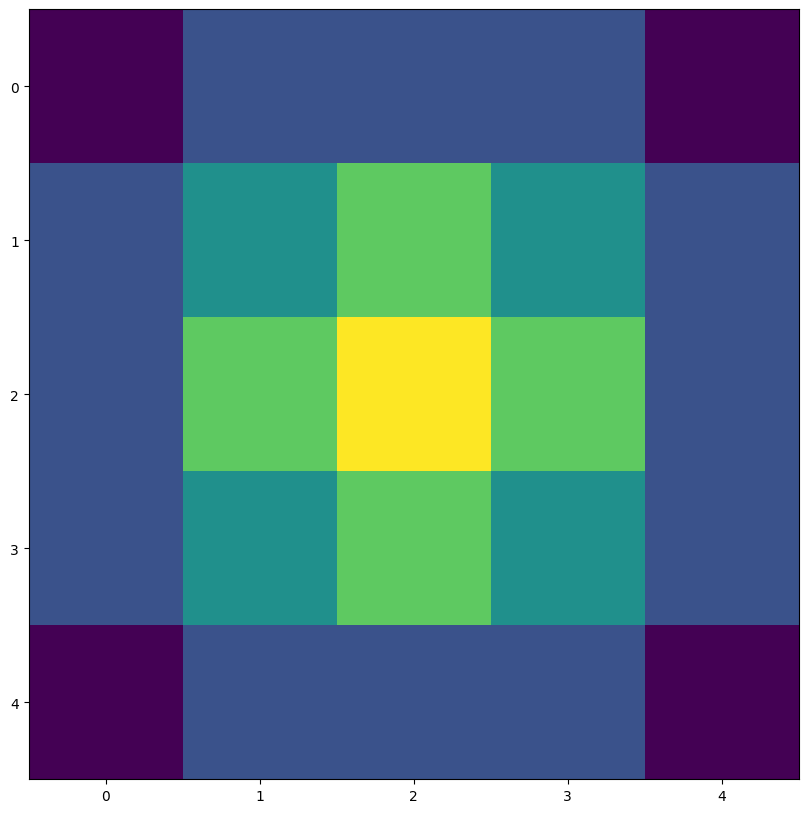

In [39]:
plt.imshow(matA)
plt.show()
plt.imshow(result)
plt.show()

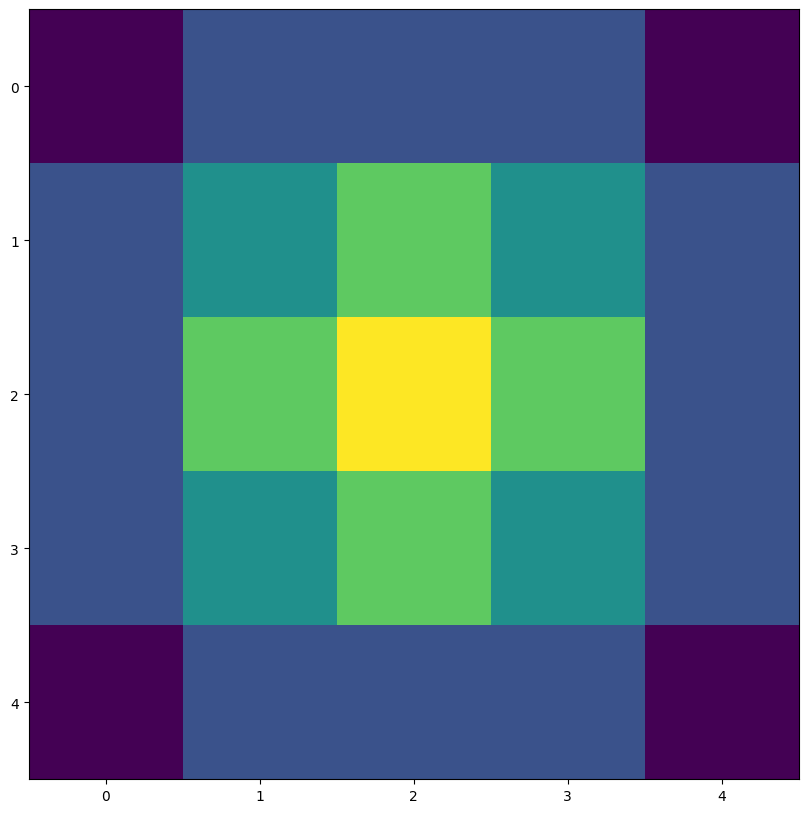

array([[0.        , 0.11111111, 0.11111111, 0.11111111, 0.        ],
       [0.11111111, 0.22222222, 0.33333333, 0.22222222, 0.11111111],
       [0.11111111, 0.33333333, 0.44444444, 0.33333333, 0.11111111],
       [0.11111111, 0.22222222, 0.33333333, 0.22222222, 0.11111111],
       [0.        , 0.11111111, 0.11111111, 0.11111111, 0.        ]])

In [40]:
plt.imshow(result / np.sum(kerK))
plt.show()

result / np.sum(kerK)

**b.** How does the output matrix compare to the original image matrix $A$? 

What type of filter is kernel $K$ acting as? 
Alternatively, if you divide the output image by `np.sum(kerK)`, what have you essentially done to the image?

**Answer:** We can see that the output matrix is a blurred version of the original image. The kernel $K$ is acting as a low-pass filter. Dividing the output image by `np.sum(kerK)` is essentially normalizing the image. The original image is sharp and the output image is blurred.

**c.** Let matrix $O_1$ be the output from the 2D convolution between image matrix $MatC$ and kernel $KerC$. Compute $O_1$. 

The same way that we write out $C$ and $D$ for you, write out the output for us as a **NumPy array**, as in output the matrix $O_1$. You may choose to write out the full convolution (by zero-padding image matrix $C$ and then convolving with kernel $D$) or simply crop the output matrix to be the same size as the input matrix.

In [41]:
# Create image matrix C.
matC = np.zeros((5, 5))
matC[:,[1,3]] = 1

matC

array([[0., 1., 0., 1., 0.],
       [0., 1., 0., 1., 0.],
       [0., 1., 0., 1., 0.],
       [0., 1., 0., 1., 0.],
       [0., 1., 0., 1., 0.]])

In [42]:
# Create filter kernel C.
kerC = np.array([-1, 0, 1])
kerC = np.expand_dims(kerC, 0)

kerC

array([[-1,  0,  1]])

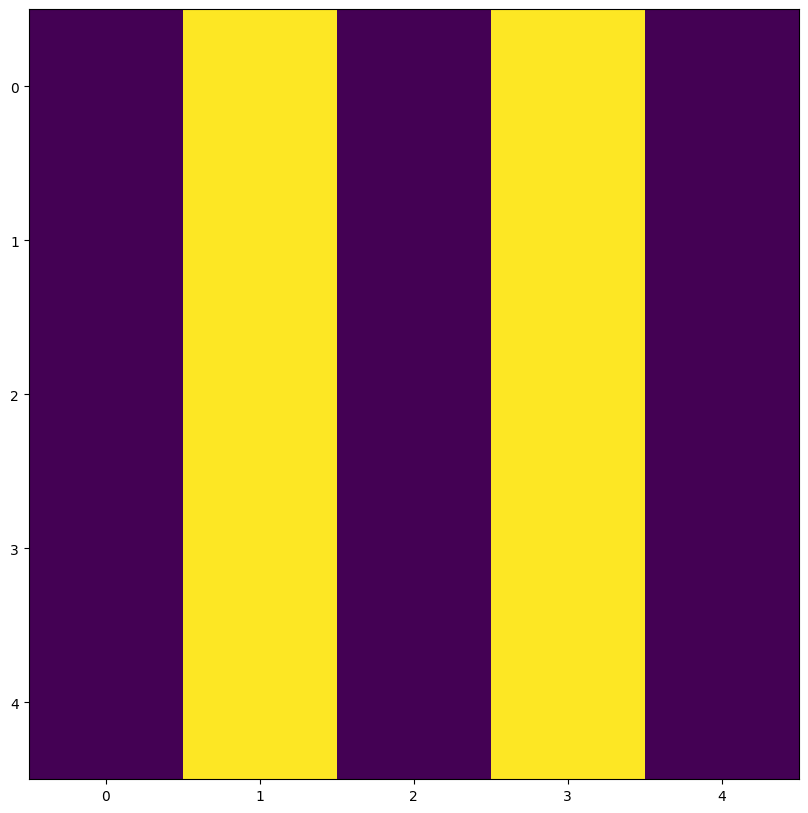

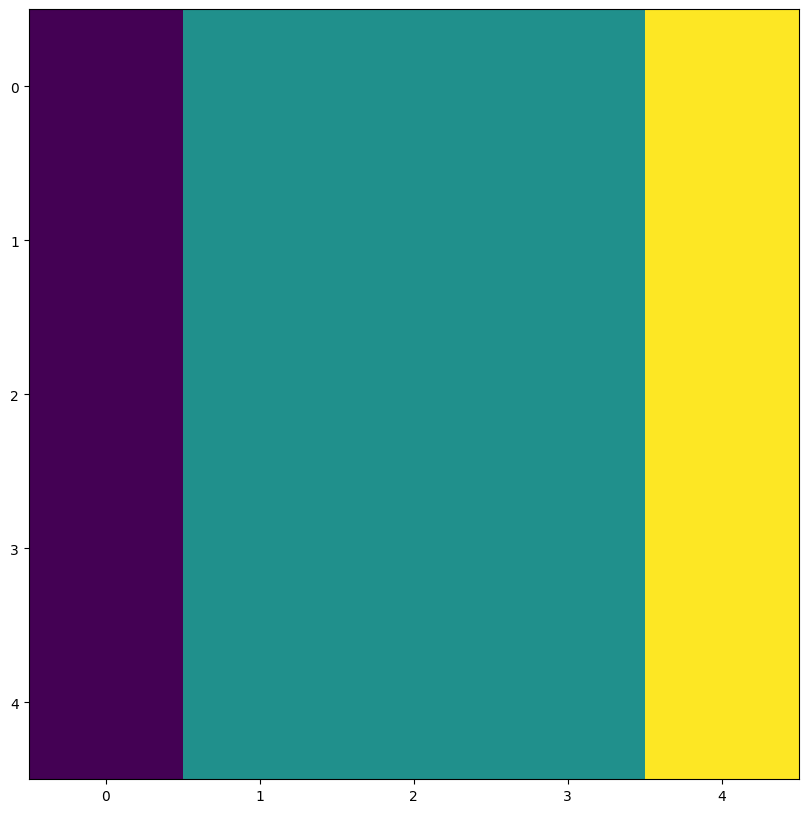

array([[-1.,  0.,  0.,  0.,  1.],
       [-1.,  0.,  0.,  0.,  1.],
       [-1.,  0.,  0.,  0.,  1.],
       [-1.,  0.,  0.,  0.,  1.],
       [-1.,  0.,  0.,  0.,  1.]])

In [43]:
## WRITE NUMPY INITIALIZATION OF MATRIX O1 IN HERE ######
import scipy.signal
O1 = scipy.signal.convolve2d(matC, kerC, mode='same')


#########################################################

plt.imshow(matC)
plt.show()
plt.imshow(O1)
plt.show()
O1

**d.** How does the output matrix $O$ compare to the original image matrix $C$?  
In other words, what kind of a filter is kernel $C$?

**Answer:** The output of trying to convolute $matC$ and $kerC$ becomes separated into 3 sections mirroring the kernel values, this is due to the reason that $kerC$ has only 1 row and 3 columns where the values are -1, 0 and 1 meanwhile  the original image is based on having only 2 "visible" columns going top to bottom. This combination naturally leads to mirroring the kernel values going top to bottom and being separated into 3 sections

**e.** Convolve image matrix $C$ with kernel $kerE$ to get matrix $O2$. How does $kerE$ differ from $kerC$?  
Try this first by hand, to get a deeper understanding of the process.

In [44]:
# Create filter kernel Ec
kerE = kerC.T

kerE

array([[-1],
       [ 0],
       [ 1]])

In [45]:
# Convolve matC and kerE to make O2.#

O2 = scipy.signal.convolve2d(matC, kerE, mode='same')

O2

array([[ 0., -1.,  0., -1.,  0.],
       [ 0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  1.,  0.]])

In [46]:
print(kerC)

print(kerE)


[[-1  0  1]]
[[-1]
 [ 0]
 [ 1]]


**Answer:** 
- kerC: [[-1, 0, 1]]
- kerE:    [[-1]
            [ 0]
            [ 1]]

kerC is a 1x3 matrix, while kerE is a 3x1 matrix. This means that kerC is a horizontal edge detector, while kerE is a vertical edge detector.

**f.** Import your favorite image as a NumPy array. Try to keep it reasonably sized (like 256-by-256) to avoid overly long computation times. If you don’t have a favorite image, you can create a matrix of zeros and ones to form shapes (such as a disk or rectangle).

Apply some additive white Gaussian noise to your image. There are many ways to do this (google it 😉) ), and you should choose your favorite method!  
Next, try to smooth out your noisy image using your favorite linear [smoothing filter](https://docs.opencv.org/3.4/dc/dd3/tutorial_gausian_median_blur_bilateral_filter.html).

Show all three images (the original image, the noisy image, and the smoothed noisy image) side-by-side using `plt.subplots()`.

Play around with the level of noise as well as the smoothing filter parameters.  
At what level of noise can you no longer distinguish the main features of the original image? 

As the level of noise increases, how should you adjust your smoothing filter parameters? What is the main downside to smoothing images?


In [47]:
def add_gaussian_noise(image, mean=0, std=25):
    row, col, ch = image.shape
    gauss = np.random.normal(mean, std, (row, col, ch))
    noisy = np.clip(image + gauss, 0, 255)
    return noisy.astype(np.uint8)



In [65]:
import cv2
import numpy as np

from PIL import Image

image_src: str = "data/brain.png"
image = np.array(Image.open(image_src).resize((256,256)))

noisy_image =  add_gaussian_noise(image)
# Picked median blur for fun
filtered_image = cv2.medianBlur(noisy_image, 5)

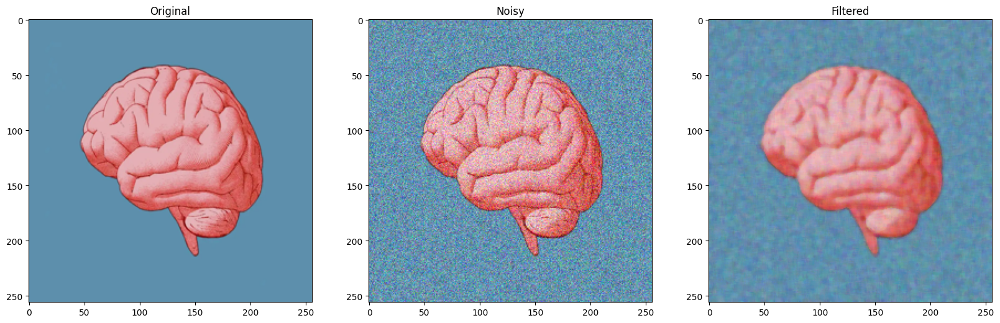

In [66]:
### DISPLAY IMAGES HERE. #############################################################################

# plt.sublot all 3 images
plt.subplot(131), plt.imshow(image), plt.title('Original')
plt.subplot(132), plt.imshow(noisy_image), plt.title('Noisy')
plt.subplot(133), plt.imshow(filtered_image), plt.title('Filtered')

plt.show()



######################################################################################################

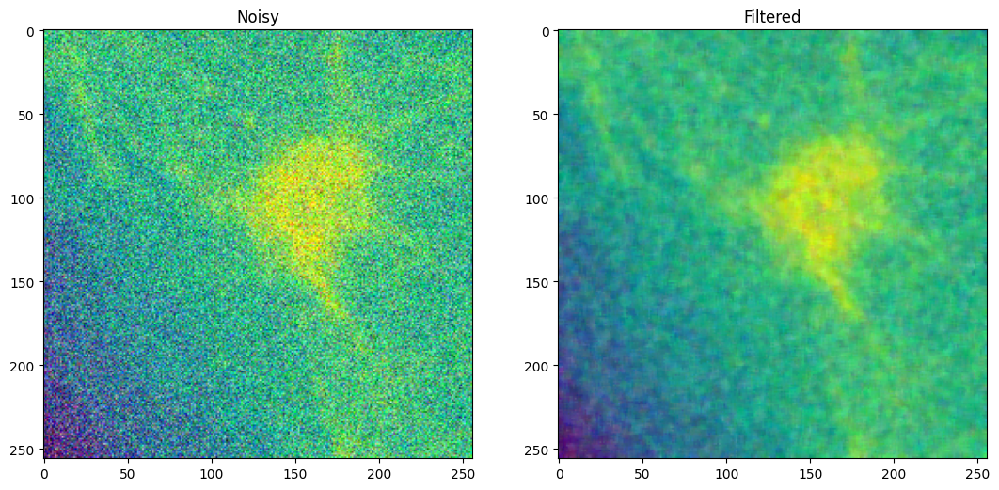

STD: 45


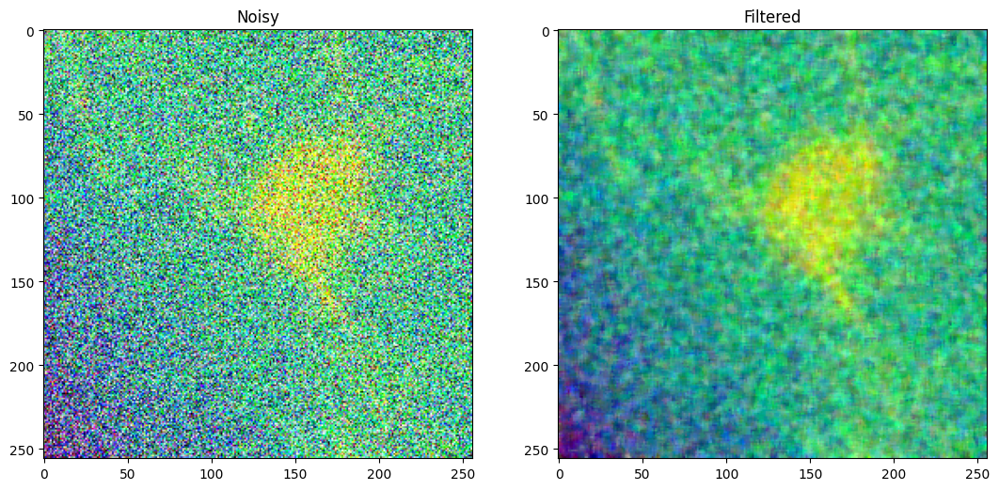

STD: 70


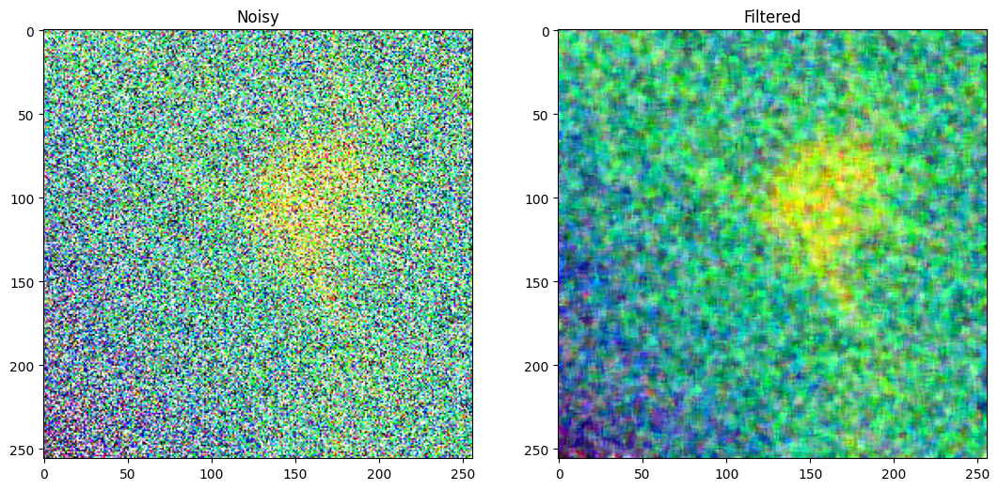

STD: 95


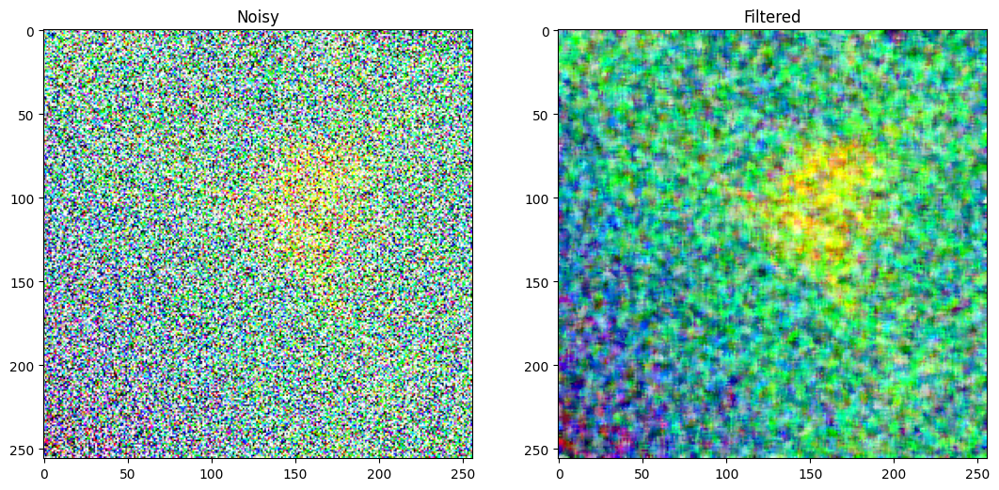

STD: 120


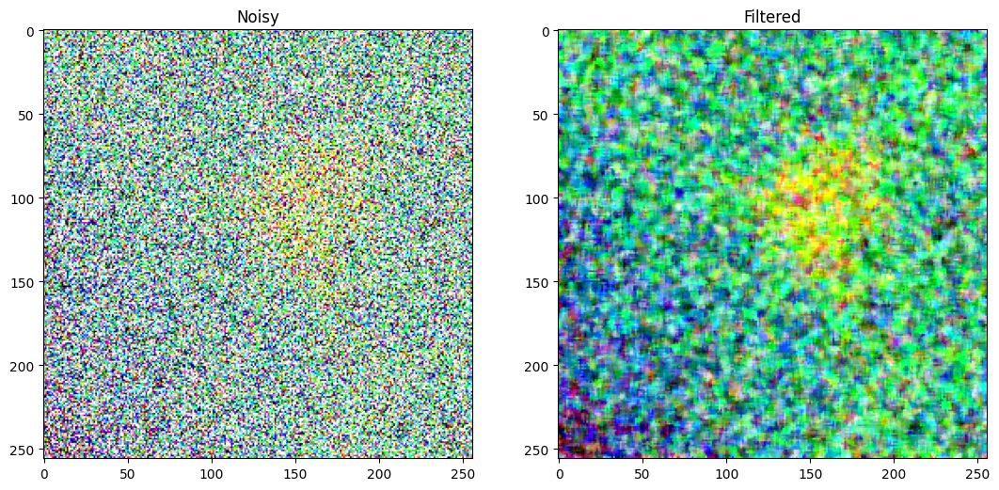

STD: 145


In [50]:
# Experiment with std values for th noise 
STARTING_STD = 20
for i in range(5):
    temp_noisy_image = add_gaussian_noise(image, std=STARTING_STD*2 )
    temp_filtered_image = cv2.medianBlur(temp_noisy_image, 5)
    plt.subplot(132), plt.imshow(temp_noisy_image), plt.title('Noisy')
    plt.subplot(133), plt.imshow(temp_filtered_image), plt.title('Filtered')
    plt.show()
    STARTING_STD += 25
    print(f"STD: {STARTING_STD}")

**Answer:** As we can see from the set of generated images by increasing the level of noise, the original image becomes more and more distorted. The main downside to smoothing images is that it can blur the image and remove important details. By the last image we can barely see that the original image was a brain. 

**g.** Try applying a linear edge detection kernel (such as a [central finite difference kernel](https://stackoverflow.com/questions/26694704/2d-image-convolution-central-difference-on-x-gradient) or Sobel operator) to both your original image and the noisy image. How does it do?

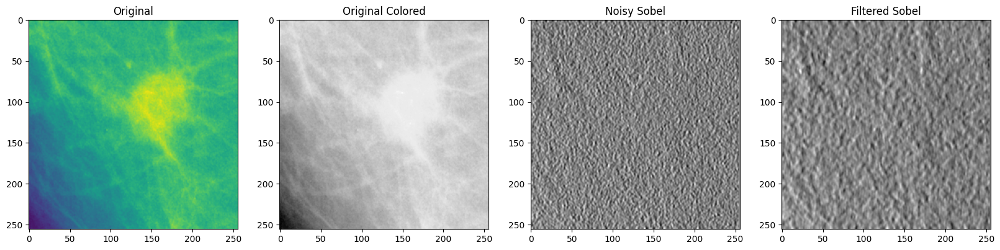

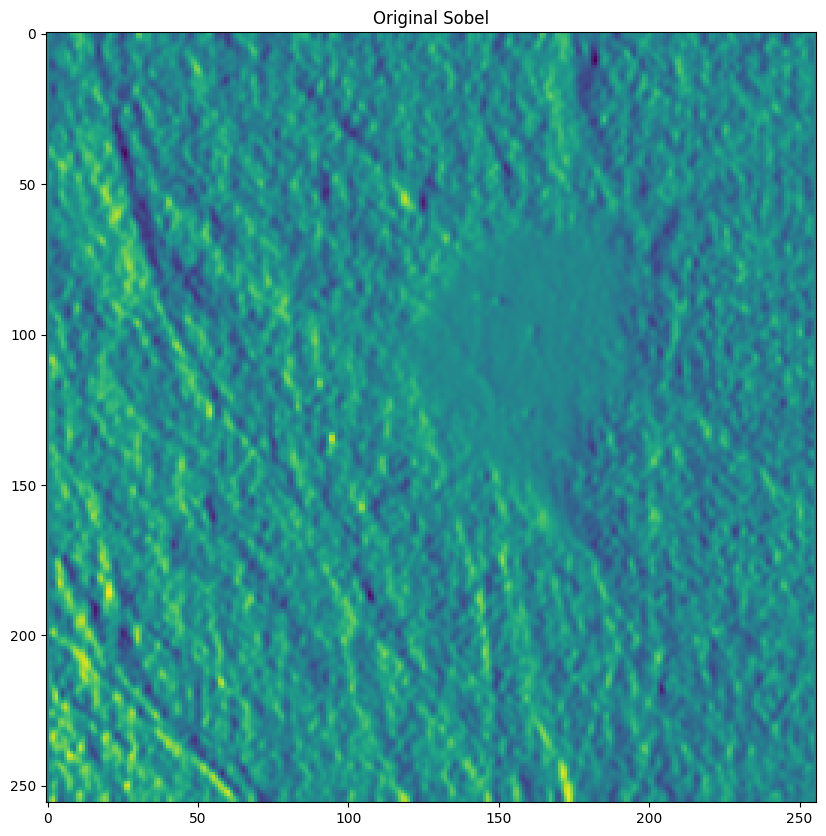

In [51]:
### APPLY THE KERNEL ON YOUR IMAGES HERE. ############################################################
# applying sobel filter

def apply_sobel_filter(noisy_image, filtered_image, image):
    #convert all the images to be popping better
    noisy_image_colored = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2GRAY)
    filtered_image_colored = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2GRAY)
    image_colored = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


    sobel_colored = cv2.Sobel(image_colored, cv2.CV_64F, 1, 0, ksize=5)
    sobel_noisy = cv2.Sobel(noisy_image_colored, cv2.CV_64F, 1, 0, ksize=5)
    sobel_filtered = cv2.Sobel(filtered_image_colored, cv2.CV_64F, 1, 0, ksize=5)

    # plot original, original colored, noisy sobel, filtered sobel
    plt.subplot(141), plt.imshow(image), plt.title('Original')
    plt.subplot(142), plt.imshow(image_colored, cmap='gray'), plt.title('Original Colored')
    plt.subplot(143), plt.imshow(sobel_noisy, cmap='gray'), plt.title('Noisy Sobel')
    plt.subplot(144), plt.imshow(sobel_filtered, cmap='gray'), plt.title('Filtered Sobel')

    plt.show()

    plt.imshow(sobel_colored, cmap='viridis'), plt.title('Original Sobel')
    plt.show()

apply_sobel_filter(noisy_image, filtered_image, image)
######################################################################################################

**Answer:** To my surprise, the Sobel Kernel did a fantastic job at detecting the edges of the brain in the original image, this is also relevant for both noisy sobel and filtered sobel. The edges are still very well defined and the image is still recognizable.

**h.** Linear [smoothing filters](https://docs.opencv.org/3.4/d4/d13/tutorial_py_filtering.html) are an efficient way to reduce the presence of noise in the image at the cost of lowering image resolution and blurring out edges. Several *non*-linear filters were developed to both reduce noise while attempting to preserve the high frequency edges in the image.  
Choose a *non*-linear de-noising filter and apply it to your noisy image from part f. How well does it do compared to the image that was de-noised using a linear smoothing filter?

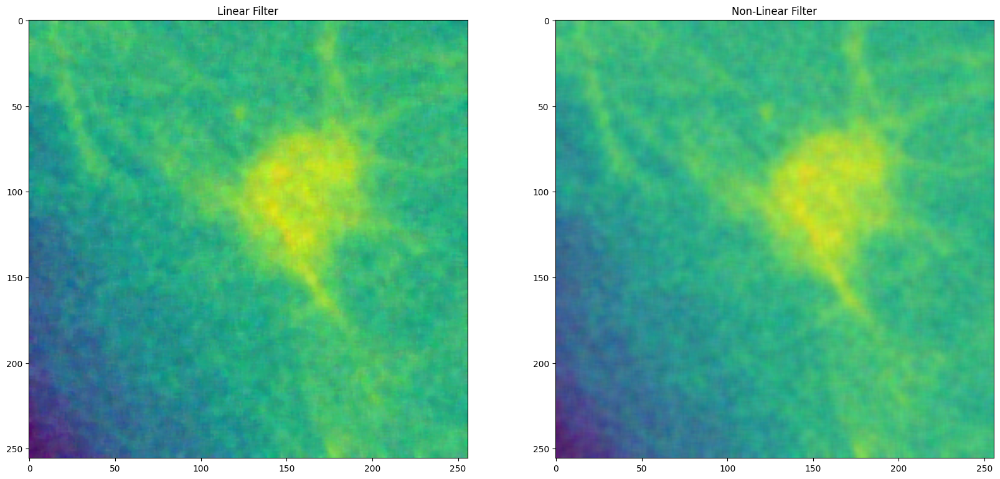

In [52]:
### WRITE CODE IN HERE. ##############################################################################

# Choose a *non*-linear de-noising filter and apply it to your noisy image from part f. How well does it do compared to the image that was de-noised using a linear smoothing filter?
kernel = np.ones((5,5),np.float32)/25
non_linear_filtered_image = cv2.filter2D(noisy_image, -1, kernel)

# Visualize the results
plt.subplot(121), plt.imshow(filtered_image), plt.title('Linear Filter')
plt.subplot(122), plt.imshow(non_linear_filtered_image), plt.title('Non-Linear Filter')
plt.show()

    

### WRITE CODE IN HERE. ##############################################################################


######################################################################################################

**Answer:** By the results of the non-linear filter, we can see that the results against a linear filter are basically the same. The non-linear filter blurred the image slighlty more than the linear filter, but the results are very similar.

## Problem 2: Geometric Features (25 points)

As you may know, the geometric features of a tumor can sometimes reveal significant information about whether it is benign or malignant. Radiologists frequently [assess the geometry of lesions in mammograms](https://www.sciencedirect.com/science/article/pii/S2211568413003872) when attempting to diagnose breast cancer.

In this exercise, we will attempt to explore some **quantitative** methods of differentiating between certain lesion shapes.

Download the two mammograms from Teams Files. [`LEFT_CC_BENIGN.tif`](https://imcfhkrems.sharepoint.com/:i:/r/teams/LV_66620/Freigegebene%20Dokumente/General/Exercise%202/LEFT_CC_BENIGN.tif?csf=1&web=1&e=1qOdKn) depicts a cranial-caudal view (looking down on the breast from the patient's perspective) of the left breast. There is a benign lesion present in the mammogram. Can you locate it? 

If you are having difficulty locating the lesion, try seeing if you can spot it in the mask [`LEFT_CC_BENIGN_MASK.tif`](https://imcfhkrems.sharepoint.com/:i:/r/teams/LV_66620/Freigegebene%20Dokumente/General/Exercise%202/LEFT_CC_BENIGN_MASK.tif?csf=1&web=1&e=kf8uUt), which consists of a rough segmentation of the lesion. [`RIGHT_CC_MALIGNANT.tif`](https://imcfhkrems.sharepoint.com/:i:/r/teams/LV_66620/Freigegebene%20Dokumente/General/Exercise%202/RIGHT_CC_MALIGNANT.tif?csf=1&web=1&e=jdFP9X) and [`RIGHT_CC_MALIGNANT_MASK.tif`](https://imcfhkrems.sharepoint.com/:i:/r/teams/LV_66620/Freigegebene%20Dokumente/General/Exercise%202/RIGHT_CC_MALIGNANT_MASK.tif?csf=1&web=1&e=dJTJ0n) are the mammogram and corresponding lesion segmentation of a different patient, but this mammogram depicts a breast with a **malignant** tumor.

**a.** Start by loading these two mammograms and their corresponding masks as image matrices. 
Plot them on a single figure (e.g., using a 2-by-2 grid of subplots, or merge the mask as a semi transparent/colored layer). You should use reasonable **x** and **y** limits in your figures to get a reasonable depiction of your lesion segmentations.

Qualitatively describe the shape differences between the two lesions. What types of shapes and margins are indicative of malignant tumors?

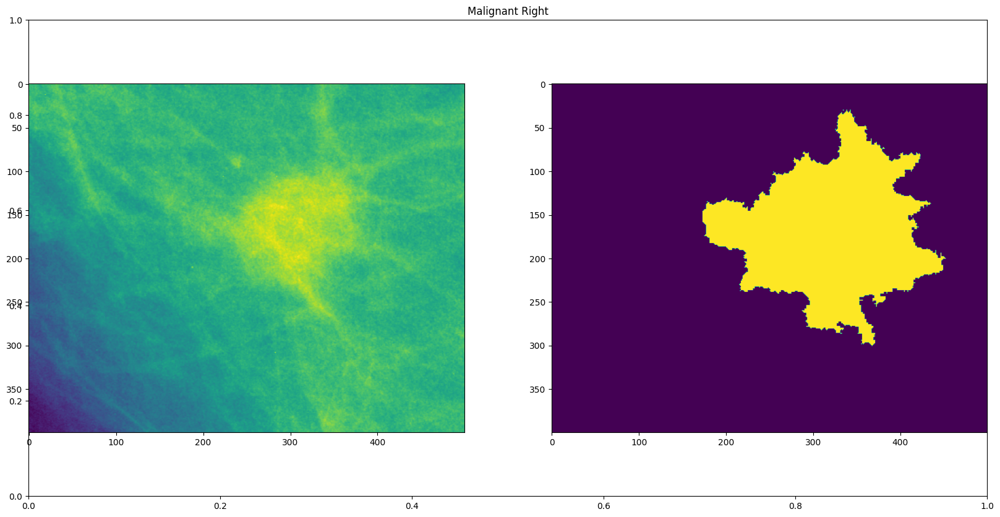

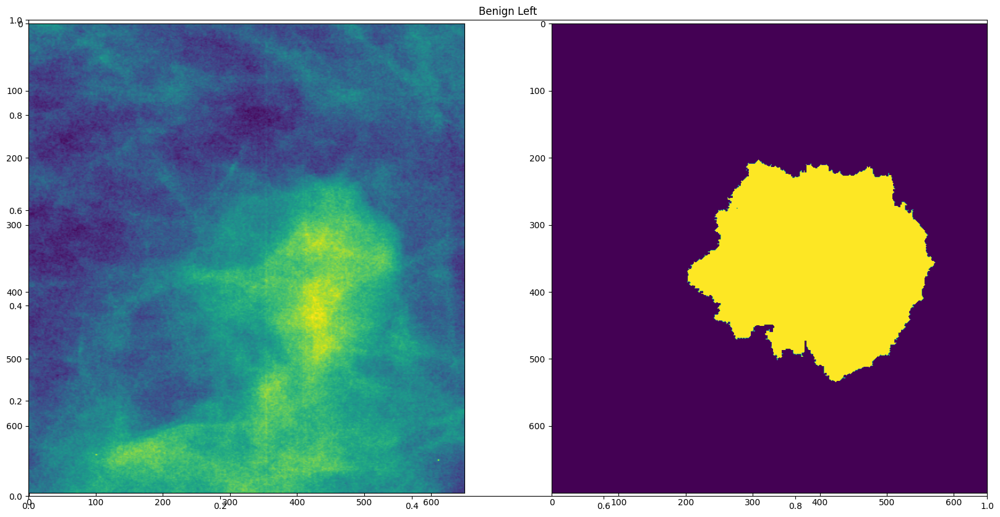

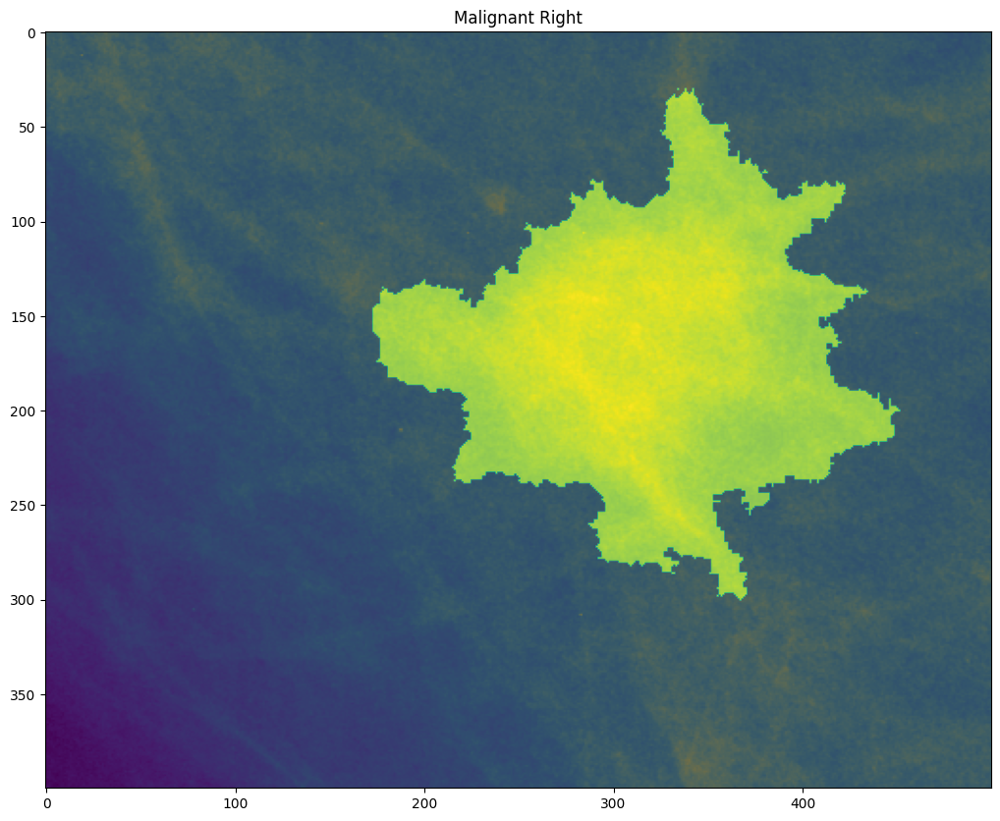

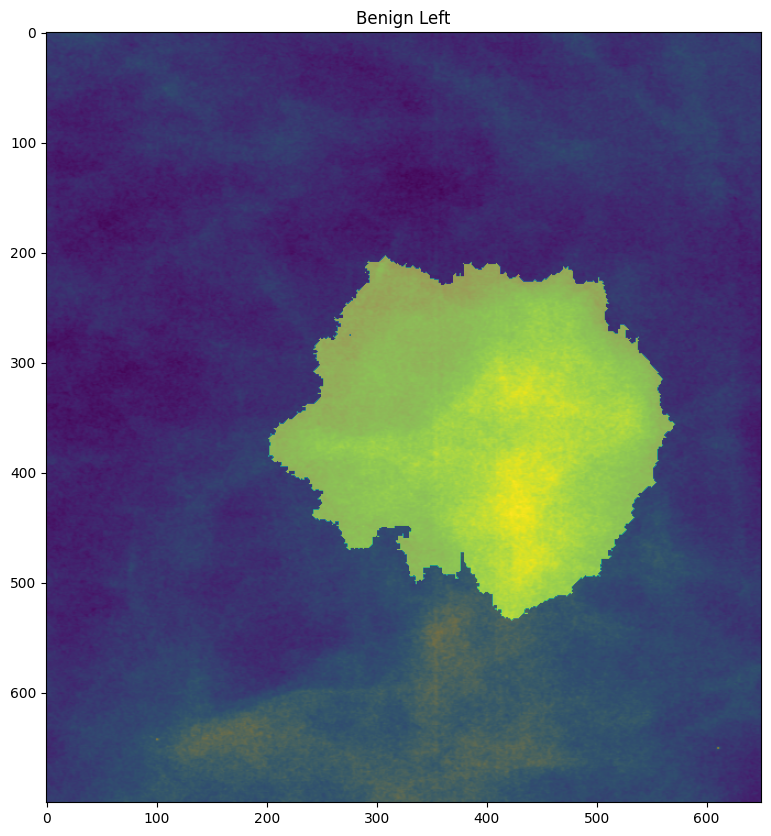

In [53]:
### WRITE CODE IN HERE. You can have up to 2 cells for this question, but only one is required #######


    
# Load the images
left_cc_benign = "LEFT_CC_BENIGN.tif"
left_cc_benign_mask = "LEFT_CC_BENIGN_MASK.tif"


left_cc_benign = np.array(Image.open(left_cc_benign))
left_cc_benign_mask = np.array(Image.open(left_cc_benign_mask))


right_cc_malignant = "RIGHT_CC_MALIGNANT.tif"
right_cc_malignant_mask = "RIGHT_CC_MALIGNANT_MASK.tif"


right_cc_malignant = np.array(Image.open(right_cc_malignant))
right_cc_malignant_mask = np.array(Image.open(right_cc_malignant_mask))




# Visualize the images
plt.title('Malignant Right')

# the Tumor is located in the area: (x1, y1) and (x2, y2)
# x1 = 1100, y1 = 3100, x2 = 1600, y2 = 3500
extracted_tumor_right_cc_malignant = right_cc_malignant[3100:3500, 1100:1600]
extracted_tumor_right_cc_malignant_mask = right_cc_malignant_mask[3100:3500, 1100:1600]

plt.subplot(121), plt.imshow(extracted_tumor_right_cc_malignant, cmap='viridis')
plt.subplot(122), plt.imshow(extracted_tumor_right_cc_malignant_mask, cmap='viridis')
plt.show()

plt.title('Benign Left')

# the Tumor is located in the area: (x1, y1) and (x2, y2)
# x1 = 1100, y1 = 2200, x2 = 1750, y2 = 2900

extracted_tumor_left_cc_benign = left_cc_benign[2200:2900, 1100:1750]
extracted_tumor_left_cc_benign_mask = left_cc_benign_mask[2200:2900, 1100:1750]
plt.subplot(121), plt.imshow(extracted_tumor_left_cc_benign, cmap='viridis')

plt.subplot(122), plt.imshow(extracted_tumor_left_cc_benign_mask, cmap='viridis')
plt.show()



# Overlay the masks on the images
plt.title('Malignant Right')
plt.imshow(extracted_tumor_right_cc_malignant, cmap='viridis')
plt.imshow(extracted_tumor_right_cc_malignant_mask, cmap='viridis', alpha=0.5)
plt.show()

plt.title('Benign Left')
plt.imshow(extracted_tumor_left_cc_benign, cmap='viridis')
plt.imshow(extracted_tumor_left_cc_benign_mask, cmap='viridis', alpha=0.5)
plt.show()

    
######################################################################################################


**Answer:** Based on my plots we can see the following differences between the two lesions:
- The benign lesion is a round shape with a smooth margin
- The malignant lesion is an irregular shape with a spiculated margin 

**b.** Next, try computing some basic geometric features of the two lesions. Which features are the most significant for differentiating between them? Is this what you expected? The [`regionprops()`](https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html) function in the `skimage` library will automatically compute several geometric features for you, but you might choose to code up some of your own. If you don't trust the provided segmentations, feel free to create your segmentation method or modify the provided ones to get a better estimate of the lesion shapes!  
Finally, it could be interesting to apply some edge-detection filters to the mammograms to better emphasize the margins. 

You can also test your approach on other mammograms from a [larger dataset (~20 GB)](https://imcfhkrems.sharepoint.com/:f:/r/teams/LV_62825/Class%20Materials/Exercise%202?csf=1&web=1&e=X41LBH). You will need these mammograms for the next problem set (deep-learning), so there's no harm in downloading the images now!

**There is no single correct answer for this exercise, and you should definitely try several different approaches and explore!**

In [54]:
# Concept of regionprops() to extract the area of the tumor and calculate set of features

from skimage.measure import regionprops

# Analysis of Malignant Right vs Benign Left

malignant_stats = regionprops(extracted_tumor_right_cc_malignant_mask, extracted_tumor_right_cc_malignant)
benign_stats = regionprops(extracted_tumor_left_cc_benign_mask, extracted_tumor_left_cc_benign)

# Which properties are you interested in to compare the two tumors?
# Roundness

# Calculate the roundness of the tumor
def calculate_roundness(stats):
    return 4 * np.pi * stats[0].area / (stats[0].perimeter ** 2)

malignant_roundness = calculate_roundness(malignant_stats)
benign_roundness = calculate_roundness(benign_stats)

print(f"Malignant Roundness: {malignant_roundness}")
print(f"Benign Roundness: {benign_roundness}")

print(f"Malignant Area: {malignant_stats[0].area}")
print(f"Benign Area: {benign_stats[0].area}")

print(f"Malignant Perimeter: {malignant_stats[0].perimeter}")
print(f"Benign Perimeter: {benign_stats[0].perimeter}")

"""
Malignant Roundness: 0.19850342359400897
Benign Roundness: 0.3455867336700358
Malignant Area: 35508.0
Benign Area: 79149.0
Malignant Perimeter: 1499.2844507162113
Benign Perimeter: 1696.481456229631

"""
# HYPOTHESIS:
# If the ratio of area/perimeter is larger we are more likely to have a benign tumor as by trying to have the largest area by having the smallest perimeter. This leads to maximum roundness.
# If the ratio of area/perimeter is smaller we are more likely to have a malignant tumor as when the area is smaller and the perimeter is larger, the tumor is very sharp and the edges are rough.


# Analysis of Malignant Right vs Benign Left
# Perimeter of the 2 tumors is very close to each other, but the area of the benign tumor is DOUBLE of the malignant tumor, proving the hypothesis that the area/perimeter ratio is larger for benign tumors.




Malignant Roundness: 0.19850342359400897
Benign Roundness: 0.3455867336700358
Malignant Area: 35508.0
Benign Area: 79149.0
Malignant Perimeter: 1499.2844507162113
Benign Perimeter: 1696.481456229631


'\nMalignant Roundness: 0.19850342359400897\nBenign Roundness: 0.3455867336700358\nMalignant Area: 35508.0\nBenign Area: 79149.0\nMalignant Perimeter: 1499.2844507162113\nBenign Perimeter: 1696.481456229631\n\n'

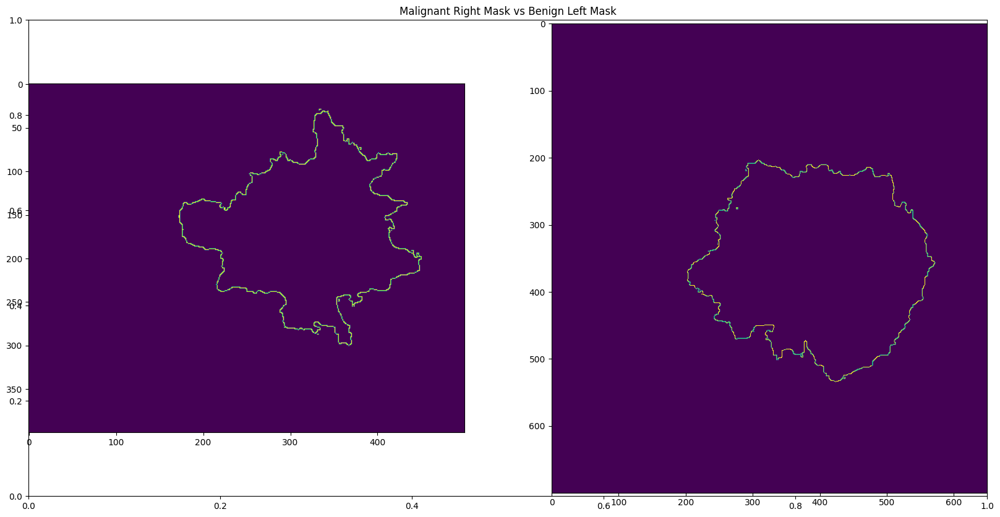

In [55]:
# Applyinh edge detection to the images to see if we can detect the tumor edges
from skimage.feature import canny
from skimage import filters


plt.title('Malignant Right Mask vs Benign Left Mask')

# allign the images
canny_malignant = canny(extracted_tumor_right_cc_malignant_mask)
canny_benign = canny(extracted_tumor_left_cc_benign_mask)

# plot the images
plt.subplot(121), plt.imshow(canny_malignant, cmap='viridis')
plt.subplot(122), plt.imshow(canny_benign, cmap='viridis')

plt.show()



Image: malignant.png


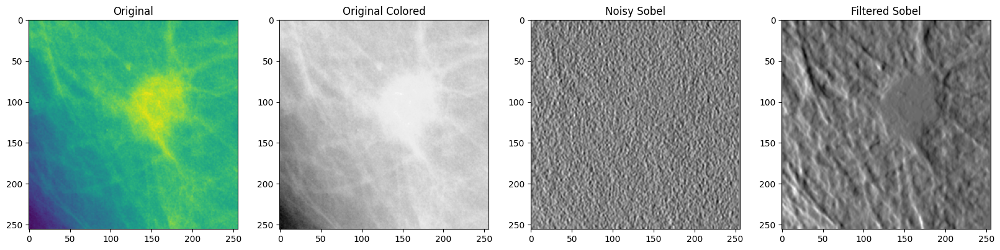

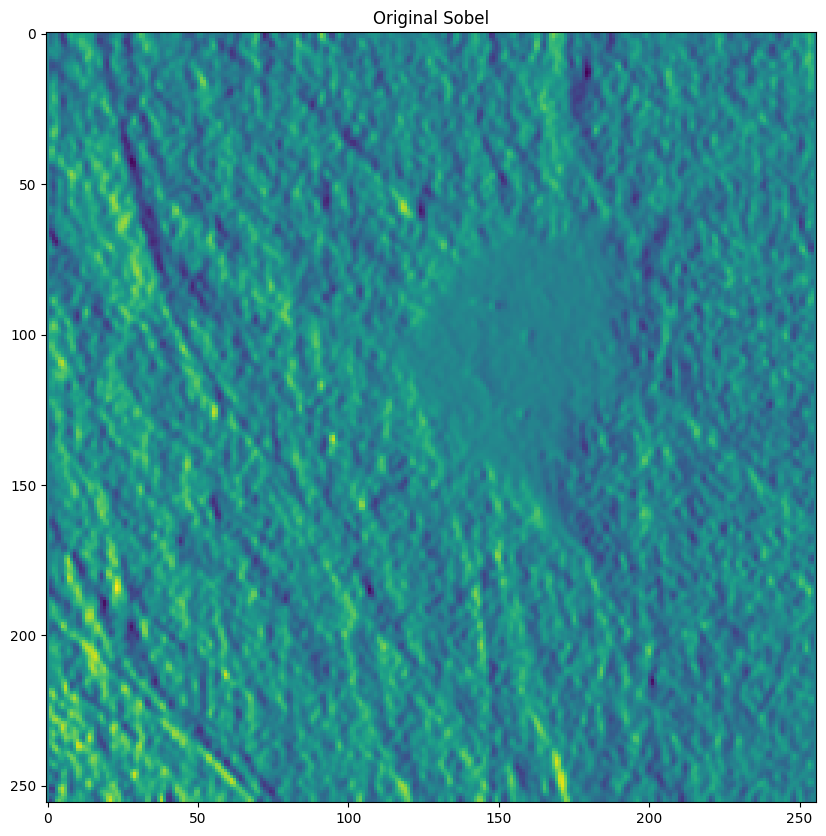

Image: benign.png


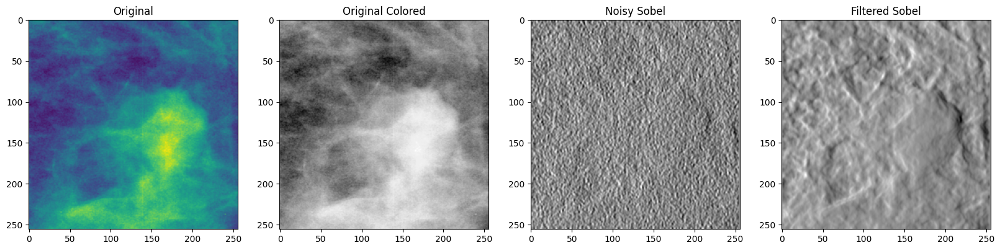

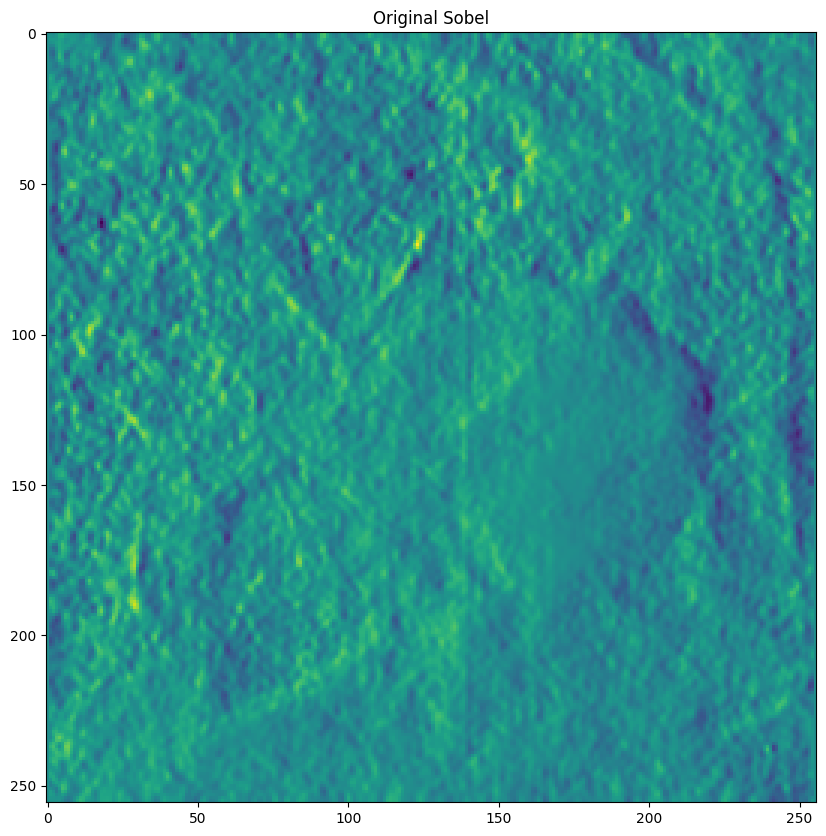

In [64]:
# Save the malignant and benign images as a png file

plt.imsave("malignant.png", extracted_tumor_right_cc_malignant, cmap='viridis')
plt.imsave("benign.png", extracted_tumor_left_cc_benign, cmap='viridis')
# Apply sobel
image_malignant = "malignant.png"
image_benign = "benign.png"


for i in [image_malignant, image_benign]:
    temp_image = np.array(Image.open(i).resize((256,256)))

    noisy_image =  add_gaussian_noise(temp_image)
    filtered_image = cv2.medianBlur(temp_image, 5)

    print(f"Image: {i}")
    apply_sobel_filter(noisy_image, filtered_image, temp_image)


# The largest differenc e we can see at the Filtered Sobel images, where the edges are more visible in the malignant tumor, compared to the benign tumor. This is a good indicator that the edge detection can be used to detect the tumor edges and differentiate between benign and malignant tumors.


## Problem 3: Tumor Classification (50 Points)

In addition to the [mammograms themselves (~20 GB)](https://imcfhkrems.sharepoint.com/:f:/r/teams/LV_62825/Class%20Materials/Exercise%202?csf=1&web=1&e=X41LBH), which is based on [this](https://wiki.cancerimagingarchive.net/display/Public/CBIS-DDSM), the dataset includes "ground-truth" segmentations and [`mass_case_description_train_set.csv`](https://imcfhkrems.sharepoint.com/:x:/r/teams/LV_66620/Freigegebene%20Dokumente/General/Exercise%202/mass_case_description_train_set.csv?d=w9374d8e3fcf14429951211d33860a248&csf=1&web=1&e=Gz5jKL), which contains metadata information about mass shapes, mass margins, assessment numbers, pathology diagnoses, and subtlety in the data. Take some time to research what all of these different fields mean and how you might utilize them in your work. Note that you don't need to use all of what is provided to you...

Here are some ideas:

1. Use the ROI’s or segmentations to extract features, and then train a classifier based on these feature table using the algorithms presented to you last year in the machine learning lectures (it doesn't have to be with deep learning).

2. Use Convolutional Neural Networks (CNNs). Feel free to use any framework or package (sklearn, pytorch, pytorch-lightning, timm, keras, Tensorflow, etc.), or create your own custom code. If you dont want to place helper functions and classes into this notebook, place them in a `.py` file in the same folder and import them into this notebook (careful not to use reserved words for this).

**a.** The delivery should be a report which includes the experiment planning, the extracted features and the results.
Try answering in your report the following questions:
- Which method(s) did you use? 
- Why did you choose these method(s)?
- What were your expectations towards these methods?
- Which method worked the best for you? Which method worked the worst? Can you think why?
- How did they perform compared to your expectations?
- Which metrics did you use? To which ones did you pay the most attention?
- How do you feel about your results? 
- How would you plan to improve your results further?  

**b.** Prepare a **presentation** based on your report, and be prepared to present your experiments and your results to the rest of the class on our upcoming session.

Please submit your slides (also possible as an exported PDF).

In [ ]:
### WRITE CODE IN HERE. You can have up to 5 cells for this question ################################












######################################################################################################